In [2]:
import json
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import pandas as pd
from animate import animate_trial


Lets find out what the average trial looks like for P0001.

In [3]:
##Find the average pose data at each frame of the data

##List of body parts used in the data
body_parts = [
    "R_EYE", "L_EYE", "NOSE", "R_EAR", "L_EAR", "R_SHOULDER", "L_SHOULDER",
    "R_ELBOW", "L_ELBOW", "R_WRIST", "L_WRIST", "R_HIP", "L_HIP", "R_KNEE", 
    "L_KNEE", "R_ANKLE", "L_ANKLE", "R_1STFINGER","R_5THFINGER", "L_1STFINGER", "L_5THFINGER",
    "R_1STTOE", "R_5THTOE", "L_1STTOE", "L_5THTOE", "R_CALC", "L_CALC"
]

##Load all data first to avoid reopening files all the time
all_data = []
for trial_number in range(1, 126):
    trial_id = str(trial_number).zfill(4)
    with open(f'./data/P0001/BB_FT_P0001_T{trial_id}.json') as json_file:
        free_throw_data = json.load(json_file)
        all_data.append(free_throw_data)

##Initialize dictionaries to store averaged positions for all body parts and the ball at each frame
averaged_positions = {frame: {part: np.zeros(3) for part in body_parts} for frame in range(240)}
averaged_ball_positions = {frame: np.zeros(3) for frame in range(240)}

##Loop over all frames and body parts to sum the positions across trials
for frame in range(240):
    for free_throw_data in all_data:
        ##Sum the positions for all body parts
        for part in body_parts:
            position = np.array(free_throw_data['tracking'][frame]['data']['player'].get(part, [0, 0, 0]))
            averaged_positions[frame][part] += position

        ##Sum the ball positions
        ball_position = np.array(free_throw_data['tracking'][frame]['data'].get('ball', [0, 0, 0]))
        averaged_ball_positions[frame] += ball_position

    ##Average the positions over the 125 trials by divinding by 125
    for part in body_parts:
        averaged_positions[frame][part] /= 125 

    averaged_ball_positions[frame] /= 125

##Put the averages into a list of dictionaries, eg the same format as the original data
average_trial_tracking = []
for frame in range(240):
    frame_data = {
        'frame': frame,
        'data': {
            'ball': averaged_ball_positions[frame].tolist(),  # Add the averaged ball position
            'player': {}
        }
    }
    for part in body_parts:
        frame_data['data']['player'][part] = averaged_positions[frame][part].tolist()
    average_trial_tracking.append(frame_data)



In [4]:
##Find the avergae outcome of a trial characterized by landing coordinate and angle
landing_x = []
landing_y = []
entry_angle = []


for trial_number in range(1,126):

    trial_id = str(trial_number).zfill(4)

    with open(f'./data/P0001/BB_FT_P0001_T{trial_id}.json') as json_file:
        free_throw_data = json.load(json_file)
    
    landing_x.append(free_throw_data['landing_x'])
    landing_y.append(free_throw_data['landing_y'])
    entry_angle.append(free_throw_data['entry_angle'])

##Find average for each
av_landing_x = sum(landing_x)/len(landing_x)
av_landing_y = sum(landing_y)/len(landing_y)
av_entry_angle = sum(entry_angle)/len(entry_angle)


In [5]:
##Construct an average trial that has the same format as the data so it can be animated
Average_Trial = {
    'participant':'P0001',
    'trial_id':'average',
    'result':np.nan,
    'landing_x':av_landing_x,
    'landing_y':av_landing_y,
    'entry_angle':av_entry_angle,
    'tracking':average_trial_tracking
    
}

In [6]:
##Export the average trial as a json so it can be read by the animation function
with open('Average_Trial.json', 'w') as json_file:
    json.dump(Average_Trial, json_file, indent=4) ##I've been told 'indent=4' makes things pretty

Now that we have the data we can animate what an "average trial" looks like

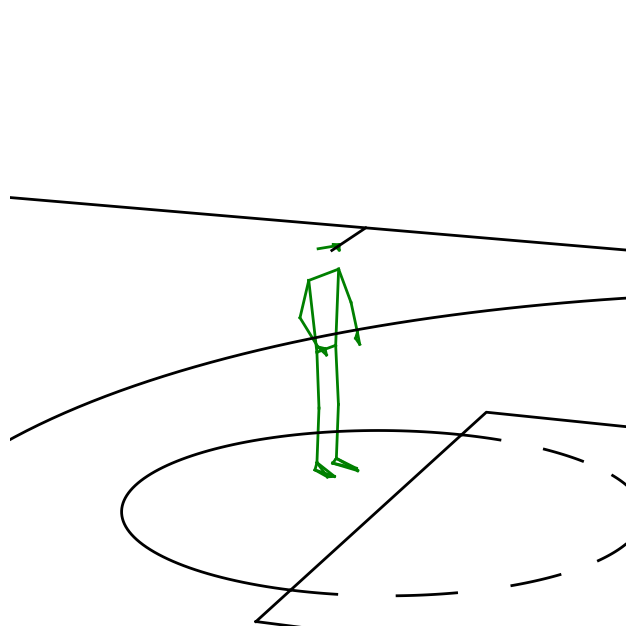

In [7]:
animate_trial('Average_Trial.json', azim=290, player_color='green')

Now lets examine the differences between a single trial and the average trial

In [8]:
with open('./data/P0001/BB_FT_P0001_T0001.json') as json_file:
    T0001 = json.load(json_file)

In [9]:
##Function to find difference between two trials
def trial_difference(trial1, trial2):
    ##List of body parts used in the data
    body_parts = [
        "R_EYE", "L_EYE", "NOSE", "R_EAR", "L_EAR", "R_SHOULDER", "L_SHOULDER",
        "R_ELBOW", "L_ELBOW", "R_WRIST", "L_WRIST", "R_HIP", "L_HIP", "R_KNEE", 
        "L_KNEE", "R_ANKLE", "L_ANKLE", "R_1STFINGER","R_5THFINGER", "L_1STFINGER", "L_5THFINGER",
        "R_1STTOE", "R_5THTOE", "L_1STTOE", "L_5THTOE", "R_CALC", "L_CALC"
    ]
    ##Initialize dictionaries to store position differences for all body parts and the ball at each frame
    body_position_differences = {frame: {part: np.zeros(3) for part in body_parts} for frame in range(240)}
    ball_position_differences = {frame: np.zeros(3) for frame in range(240)}

    ##Loop over all frames and body parts to subtract the positions across trials
    for frame in range(240):
        for part in body_parts:
            position1 = np.array(trial1['tracking'][frame]['data']['player'].get(part, [0, 0, 0]))
            position2 = np.array(trial2['tracking'][frame]['data']['player'].get(part, [0, 0, 0]))
            body_position_differences[frame][part] = position1 - position2

        ##Sum the ball positions
        ball_position1 = np.array(trial1['tracking'][frame]['data'].get('ball', [0, 0, 0]))
        ball_position2 = np.array(trial2['tracking'][frame]['data'].get('ball', [0, 0, 0]))
        ball_position_differences[frame] = ball_position1 - ball_position2

   ##Put the differences into a list of dictionaries, eg the same format as the original data
    trial_difference_tracking = []
    for frame in range(240):
        frame_data = {
            'frame': frame,
            'data': {
                'ball': ball_position_differences[frame].tolist(),  # Add the averaged ball position
                'player': {}
            }
        }
        for part in body_parts:
            frame_data['data']['player'][part] = body_position_differences[frame][part].tolist()
        trial_difference_tracking.append(frame_data)

    return trial_difference_tracking

Now I want to plot the differences between T0001 and the average trial<br>Lets look at the differences of the right elbow, the players shooting elbow, in each direction

Trial reulted in a missed free throw


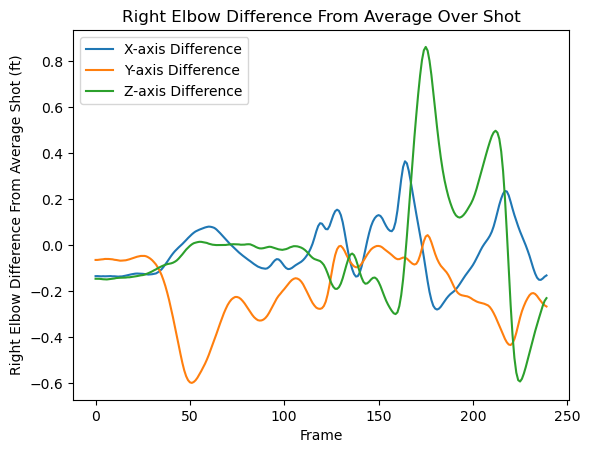

In [10]:
for trial_number in range(1,126):

    trial_number_corrected = str(trial_number).zfill(4)

    with open(f'./data/P0001/BB_FT_P0001_T{trial_number_corrected}.json') as json_file:
        free_throw_data = json.load(json_file)

    free_throw_difference = trial_difference(free_throw_data, Average_Trial)
    elbow_x_difference = [f['data']['player']['R_ELBOW'][0] for f in free_throw_difference]
    elbow_y_difference = [f['data']['player']['R_ELBOW'][1] for f in free_throw_difference]
    elbow_z_difference = [f['data']['player']['R_ELBOW'][2] for f in free_throw_difference]

    plt.plot(elbow_x_difference, label = 'X-axis Difference')
    plt.plot(elbow_y_difference, label = 'Y-axis Difference')
    plt.plot(elbow_z_difference, label = 'Z-axis Difference')
    
    ##Let's print the result of the trial for context
    print(f"Trial reulted in a {free_throw_data['result']} free throw")
    break

plt.xlabel('Frame')
plt.ylabel('Right Elbow Difference From Average Shot (ft)')
plt.title('Right Elbow Difference From Average Over Shot')
plt.legend()
plt.show()



Lets look at what the differnce looks like on a trial that results in a make

Trial reulted in a made free throw


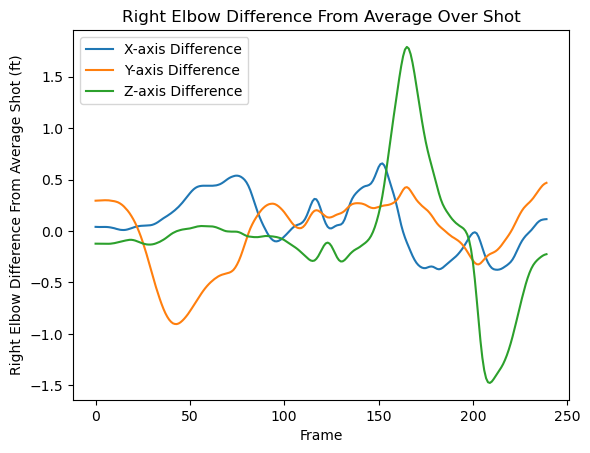

In [11]:
for trial_number in range(2,126):

    trial_number_corrected = str(trial_number).zfill(4)

    with open(f'./data/P0001/BB_FT_P0001_T{trial_number_corrected}.json') as json_file:
        free_throw_data = json.load(json_file)

    free_throw_difference = trial_difference(free_throw_data, Average_Trial)
    elbow_x_difference = [f['data']['player']['R_ELBOW'][0] for f in free_throw_difference]
    elbow_y_difference = [f['data']['player']['R_ELBOW'][1] for f in free_throw_difference]
    elbow_z_difference = [f['data']['player']['R_ELBOW'][2] for f in free_throw_difference]

    plt.plot(elbow_x_difference, label = 'X-axis Difference')
    plt.plot(elbow_y_difference, label = 'Y-axis Difference')
    plt.plot(elbow_z_difference, label = 'Z-axis Difference')
    
    ##Let's print the result of the trial for context
    print(f"Trial reulted in a {free_throw_data['result']} free throw")
    break

plt.xlabel('Frame')
plt.ylabel('Right Elbow Difference From Average Shot (ft)')
plt.title('Right Elbow Difference From Average Over Shot')
plt.legend()
plt.show()



Lets plot all the trials in along with whether they were makes or misses

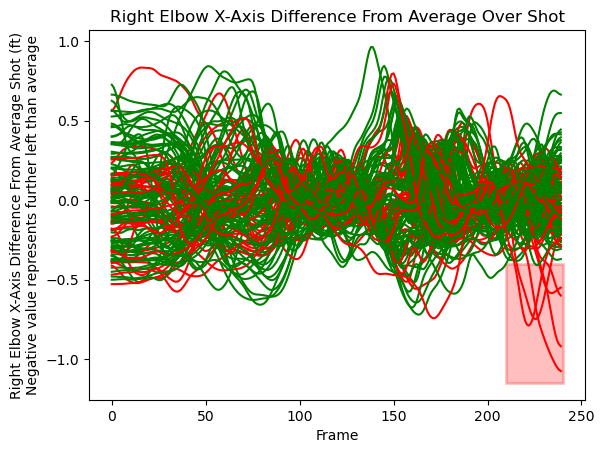

In [12]:
for trial_number in range(1,126):

    trial_number_corrected = str(trial_number).zfill(4)

    with open(f'./data/P0001/BB_FT_P0001_T{trial_number_corrected}.json') as json_file:
        free_throw_data = json.load(json_file)

    free_throw_difference = trial_difference(free_throw_data, Average_Trial)
    elbow_x_difference = [f['data']['player']['R_ELBOW'][0] for f in free_throw_difference]
    
    color = 'green' if free_throw_data['result'] == 'made' else 'red'

    plt.plot(elbow_x_difference, color = color)


plt.xlabel('Frame')
plt.ylabel('Right Elbow X-Axis Difference From Average Shot (ft)\nNegative value represents further left than average')
plt.title('Right Elbow X-Axis Difference From Average Over Shot')
rect = patches.Rectangle((210, -0.4), width=30, height=-0.75, edgecolor='red', facecolor='red',alpha=0.25, lw=2)
plt.gca().add_patch(rect)
plt.show()



So, a lot of information stacked on top of each other, but one trend I see is in the bottom right of the graph: a group of missed free throws with negative X-axis difference.<br>At this point it is important to look at the data so we can actually interpret these numbers, so lets do that now!

In [13]:
for trial_number in range(1,126):

    trial_id = str(trial_number).zfill(4)

    with open(f'./data/P0001/BB_FT_P0001_T{trial_id}.json') as json_file:
        free_throw_data = json.load(json_file)
        break
free_throw_data['tracking'][0]

{'frame': 0,
 'time': 0,
 'data': {'ball': [nan, nan, nan],
  'player': {'R_EYE': [26.339, 1.389, 5.521],
   'L_EYE': [26.312, 1.521, 5.522],
   'NOSE': [26.37, 1.48, 5.41],
   'R_EAR': [26.016, 1.134, 5.477],
   'L_EAR': [26.07, 1.586, 5.497],
   'R_SHOULDER': [25.784, 0.837, 4.782],
   'L_SHOULDER': [26.197, 1.812, 4.825],
   'R_ELBOW': [25.802, 0.666, 3.857],
   'L_ELBOW': [26.382, 1.904, 3.856],
   'R_WRIST': [26.169, 0.576, 3.1],
   'L_WRIST': [26.732, 1.817, 3.021],
   'R_HIP': [25.872, 1.032, 3.056],
   'L_HIP': [26.127, 1.671, 3.05],
   'R_KNEE': [25.879, 1.024, 1.74],
   'L_KNEE': [26.145, 1.581, 1.667],
   'R_ANKLE': [25.788, 1.039, 0.427],
   'L_ANKLE': [26.061, 1.578, 0.351],
   'R_1STFINGER': [26.334, 0.689, 2.957],
   'R_5THFINGER': [26.368, 0.691, 2.866],
   'L_1STFINGER': [26.74, 1.703, 2.803],
   'L_5THFINGER': [26.755, 1.831, 2.694],
   'R_1STTOE': [26.171, 1.038, 0.164],
   'R_5THTOE': [26.055, 0.916, 0.169],
   'L_1STTOE': [26.583, 1.606, 0.114],
   'L_5THTOE': [26.

By examining the position data, we see that the right elbow always has a lower X-axis value than the left elbow => Implying that a negative X-axis difference represents a body part being to the left of average.<br>We see that right wrist has a lower Y-axis value than right elbow => Implying that a negative Y-axis difference represents a body part being further towards the basket than average.<br>Vertical position is a little easier to interpret, a positive difference represents being higher above the court than average, negative representing closer to court than average

Now that we can interpret better, lets look at the y-axis differences.

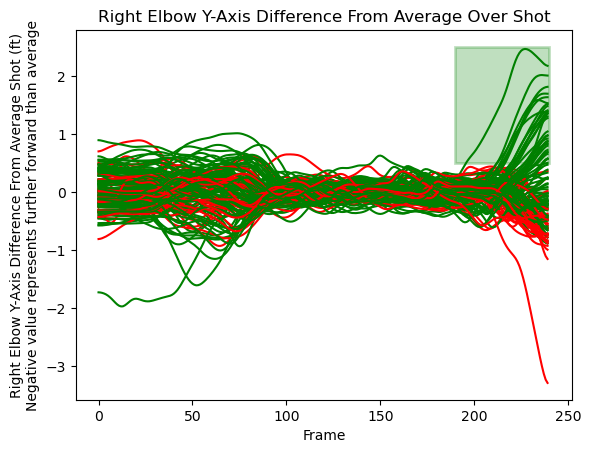

In [14]:
for trial_number in range(1,126):

    trial_number_corrected = str(trial_number).zfill(4)

    with open(f'./data/P0001/BB_FT_P0001_T{trial_number_corrected}.json') as json_file:
        free_throw_data = json.load(json_file)

    free_throw_difference = trial_difference(free_throw_data, Average_Trial)
    elbow_y_difference = [f['data']['player']['R_ELBOW'][1] for f in free_throw_difference]
    
    color = 'green' if free_throw_data['result'] == 'made' else 'red'

    plt.plot(elbow_y_difference, color = color)


plt.xlabel('Frame')
plt.ylabel('Right Elbow Y-Axis Difference From Average Shot (ft)\nNegative value represents further forward than average')
plt.title('Right Elbow Y-Axis Difference From Average Over Shot')
rect = patches.Rectangle((190, 0.5), width=50, height=2, edgecolor='green', facecolor='green',alpha=0.25, lw=2)
plt.gca().add_patch(rect)
plt.show()



Here we can see the potential utility of this study. Say this player was wondering how they could improve their free throw form. From this graph we can see that shots where the players shooting elbow was further from the basket  at the end of the shot than the average trial resulted in more makes.<br>It would not be prudent to say to the player "move your right elbow at least half a foot away from the basket as you release the ball"; but if the player was looking to make some small tweaks, advising that they could keep their shooting elbow closer to the body as they shoot is apt, actionable advice that is supported by the data.

I don't think there will be anything that pops out here, but lets now look at the vertical differences

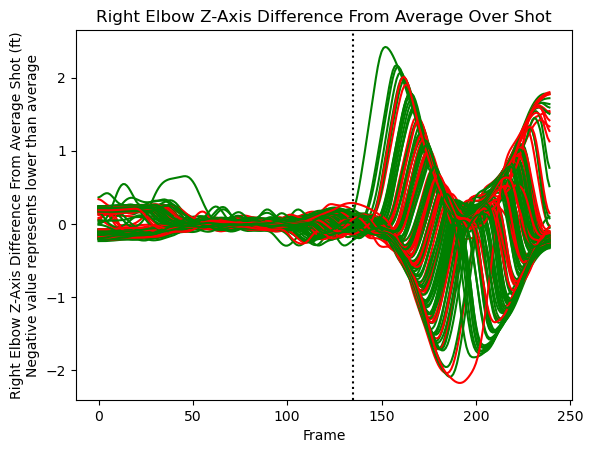

In [15]:
for trial_number in range(1,126):

    trial_number_corrected = str(trial_number).zfill(4)

    with open(f'./data/P0001/BB_FT_P0001_T{trial_number_corrected}.json') as json_file:
        free_throw_data = json.load(json_file)

    free_throw_difference = trial_difference(free_throw_data, Average_Trial)
    elbow_z_difference = [f['data']['player']['R_ELBOW'][2] for f in free_throw_difference]
    
    color = 'green' if free_throw_data['result'] == 'made' else 'red'

    plt.plot(elbow_z_difference, color = color)


plt.xlabel('Frame')
plt.ylabel('Right Elbow Z-Axis Difference From Average Shot (ft)\nNegative value represents lower than average')
plt.title('Right Elbow Z-Axis Difference From Average Over Shot')
plt.axvline(135, color = 'black', linestyle = ':')
plt.show()



Like I thought: not much for us to interpret here, but we do see an interesting trend. Up until about half way through the shot, there not much variation between trials. But once the player is in the back half of their shooting motion we observe this beautiful sinusoidal band. There is no discernable difference between makes and misses, but all of them are contained within this wide band. The player is consistently inconsistent!

Even when we unstack the makes and missed they look almost identical to each other

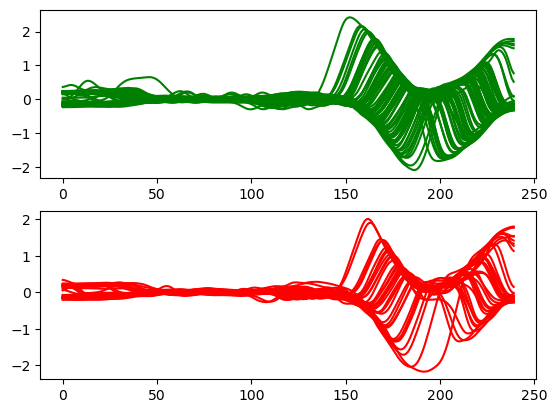

In [16]:
fig, ax = plt.subplots(2)
for trial_number in range(1,126):

    trial_number_corrected = str(trial_number).zfill(4)

    with open(f'./data/P0001/BB_FT_P0001_T{trial_number_corrected}.json') as json_file:
        free_throw_data = json.load(json_file)

    free_throw_difference = trial_difference(free_throw_data, Average_Trial)
    elbow_z_difference = [f['data']['player']['R_ELBOW'][2] for f in free_throw_difference]
    
    color = 'green' if free_throw_data['result'] == 'made' else 'red'

    if color == 'green': 
        ax[0].plot(elbow_z_difference, color = color)
    if color == 'red':
        ax[1].plot(elbow_z_difference, color = color)



plt.show()


So we've done some analysis of body parts during the shot, now lets try and find a way to quantify consistency<br>One way to do this for a single frame would be to take the norm of the difference vectors for each body part and sum them.<br>Lets do this for one trial and see if its helpful

Result was a missed shot


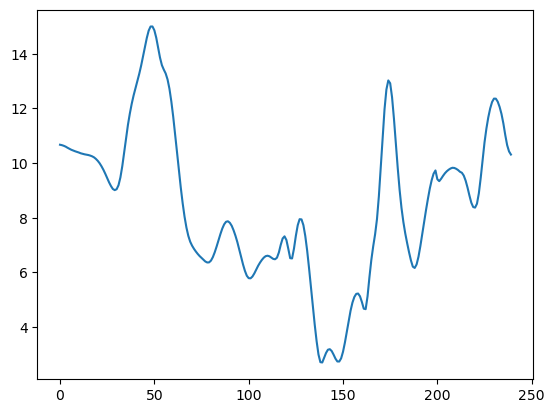

In [17]:
for trial_number in range(1,126):

    trial_number_corrected = str(trial_number).zfill(4)

    with open(f'./data/P0001/BB_FT_P0001_T{trial_number_corrected}.json') as json_file:
        free_throw_data = json.load(json_file)

    free_throw_difference = trial_difference(free_throw_data, Average_Trial)
    dv_norms = [dict((key, np.linalg.norm(value)) for key, value in f['data']['player'].items()) for f in free_throw_difference]
    dv_norm_sums = [sum(f.values()) for f in dv_norms]
    plt.plot(dv_norm_sums)
    print(f"Result was a {free_throw_data['result']} shot")
    break
    
plt.show()


Now lets plot all of them with color coding so we can distinguish makes and misses

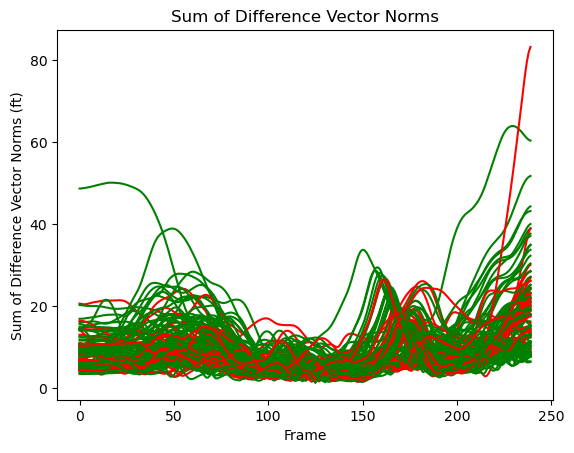

In [18]:
for trial_number in range(1,126):

    trial_number_corrected = str(trial_number).zfill(4)

    with open(f'./data/P0001/BB_FT_P0001_T{trial_number_corrected}.json') as json_file:
        free_throw_data = json.load(json_file)

    free_throw_difference = trial_difference(free_throw_data, Average_Trial)
    dv_norms = [dict((key, np.linalg.norm(value)) for key, value in f['data']['player'].items()) for f in free_throw_difference]
    dv_norm_sums = [sum(f.values()) for f in dv_norms]
    
    color = 'green' if free_throw_data['result'] == 'made' else 'red'
    
    plt.plot(dv_norm_sums, color = color)


plt.ylabel('Sum of Difference Vector Norms (ft)')
plt.xlabel('Frame')
plt.title('Sum of Difference Vector Norms')
plt.show()

This is a jumble, and there's really nothing we can pick out as a particular trend. This tells me I may need another approach for quantifying consistency.

Maybe before we attack consistency we can look at one more thing related to body parts: follow through in the shooting motion. The idea being that shots with more downward movement of the fingers at the end of the shot will have more backspin and be more likely to go in.

Lets plot the hand velocity, characterized by the wrist, 1st and 5th fingers, for one trial.

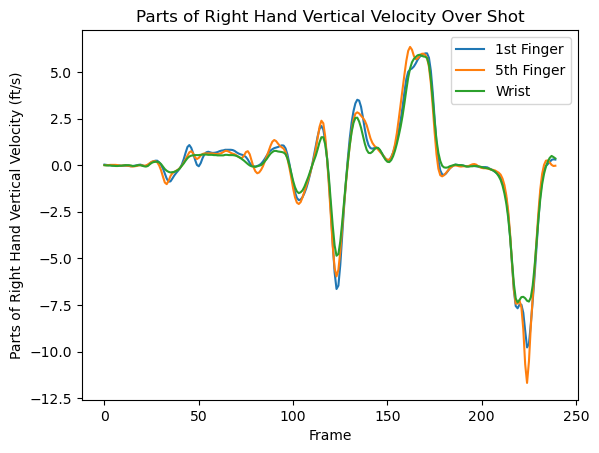

In [19]:
for trial_number in range(1,126):

    trial_number_corrected = str(trial_number).zfill(4)

    with open(f'./data/P0001/BB_FT_P0001_T{trial_number_corrected}.json') as json_file:
        free_throw_data = json.load(json_file)

    finger1_z_velocity = np.gradient([f['data']['player']['R_1STFINGER'][2] for f in free_throw_data['tracking']], 1/30, axis=-1)
    finger5_z_velocity = np.gradient([f['data']['player']['R_5THFINGER'][2] for f in free_throw_data['tracking']], 1/30, axis=-1)
    wrist_z_velocity = np.gradient([f['data']['player']['R_WRIST'][2] for f in free_throw_data['tracking']], 1/30, axis=-1)

    plt.plot(finger1_z_velocity, label = '1st Finger')
    plt.plot(finger5_z_velocity, label = '5th Finger')
    plt.plot(wrist_z_velocity, label = 'Wrist')
    break

plt.xlabel('Frame')
plt.ylabel('Parts of Right Hand Vertical Velocity (ft/s)')
plt.title('Parts of Right Hand Vertical Velocity Over Shot')
plt.legend()
plt.show()


This is exactly what I would have thought to see: the whole hand moving in concert until near the end of the shot when the player flicks his wrist sending the fingers down quickly to create backspin on the ball.<br>I'm not going to plot all the 1st fingers and all the 5th fingers together to see if there is a discernable difference between them

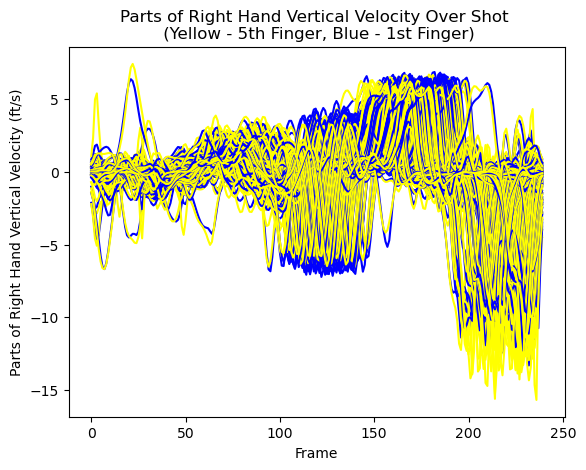

In [21]:
for trial_number in range(1,126):

    trial_number_corrected = str(trial_number).zfill(4)

    with open(f'./data/P0001/BB_FT_P0001_T{trial_number_corrected}.json') as json_file:
        free_throw_data = json.load(json_file)

    finger1_z_velocity = np.gradient([f['data']['player']['R_1STFINGER'][2] for f in free_throw_data['tracking']], 1/30, axis=-1)
    finger5_z_velocity = np.gradient([f['data']['player']['R_5THFINGER'][2] for f in free_throw_data['tracking']], 1/30, axis=-1)

    plt.plot(finger1_z_velocity, label = '1st Finger', color = 'blue')
    plt.plot(finger5_z_velocity, label = '5th Finger', color = 'yellow')

plt.xlabel('Frame')
plt.ylabel('Parts of Right Hand Vertical Velocity (ft/s)')
plt.title('Parts of Right Hand Vertical Velocity Over Shot \n (Yellow - 5th Finger, Blue - 1st Finger)')

plt.show()


Trend seems about the same as in the single trial, the player created my downward velocity with their 5th finger(pinky) than with their 1st finger(thumb). This makes sense since the pinky is more involved in the shooting motion, though it would be nice to have data on the index or middle finger!

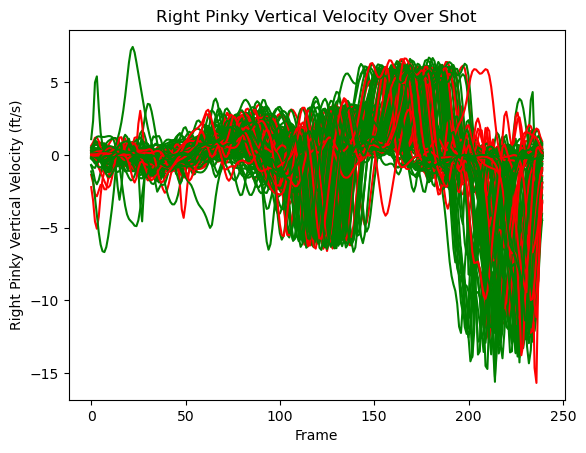

In [22]:
for trial_number in range(1,126):

    trial_number_corrected = str(trial_number).zfill(4)

    with open(f'./data/P0001/BB_FT_P0001_T{trial_number_corrected}.json') as json_file:
        free_throw_data = json.load(json_file)

    finger5_z_velocity = np.gradient([f['data']['player']['R_5THFINGER'][2] for f in free_throw_data['tracking']], 1/30, axis=-1)

    color = 'green' if free_throw_data['result'] == 'made' else 'red'
    
    plt.plot(finger5_z_velocity, label = '5th Finger', color = color)

plt.xlabel('Frame')
plt.ylabel('Right Pinky Vertical Velocity (ft/s)')
plt.title('Right Pinky Vertical Velocity Over Shot')
plt.show()


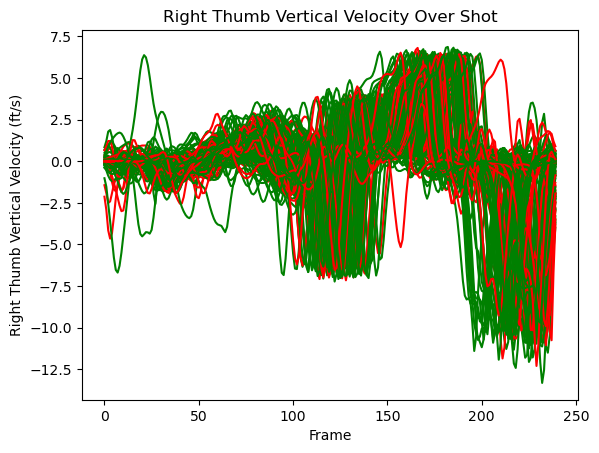

In [23]:
for trial_number in range(1,126):

    trial_number_corrected = str(trial_number).zfill(4)

    with open(f'./data/P0001/BB_FT_P0001_T{trial_number_corrected}.json') as json_file:
        free_throw_data = json.load(json_file)

    finger1_z_velocity = np.gradient([f['data']['player']['R_1STFINGER'][2] for f in free_throw_data['tracking']], 1/30, axis=-1)

    color = 'green' if free_throw_data['result'] == 'made' else 'red'
    
    plt.plot(finger1_z_velocity, label = '1st Finger', color = color)

plt.xlabel('Frame')
plt.ylabel('Right Thumb Vertical Velocity (ft/s)')
plt.title('Right Thumb Vertical Velocity Over Shot')
plt.show()
